In [1]:
import numpy as np
import dwave.inspector
from dwave.system import DWaveSampler
import pickle
import pandas as pd
from pathlib import Path  
from datetime import datetime
import matplotlib.pyplot as plt
import os
import dimod
import networkx as nx
import dwave_networkx as dnx

In [2]:

# Use a D-Wave system as the sampler
f = open("../token.txt", "r")
#sampler = DWaveSampler(solver=dict(topology__type='chimera'),token=f.read())
sampler = DWaveSampler(solver=dict(topology__type='zephyr'),token=f.read())

print("QPU {} was selected.".format(sampler.solver.name))

QPU Advantage2_prototype1.1 was selected.


In [3]:
#get the couplers and nodes available in the qpu
couplers_avail = np.array(sampler.edgelist)
nodes_avail = np.array(sampler.nodelist)

In [4]:
#make a graph of the qpu using the nodes and couplers
qpu_graph = nx.Graph()
qpu_graph.add_edges_from(couplers_avail)
qpu_graph.add_nodes_from(nodes_avail)

In [5]:
#find all cycles in the graph and sort them by length
all_cycles = nx.cycle_basis(qpu_graph)
all_cycles = sorted(all_cycles, key=len)

In [6]:
# Grouping cycles based on their lengths
nested_list = []
cycle_lengths = []
current_length = 3
current_group = []
for sub_list in all_cycles:
    if len(sub_list) == current_length:
        current_group.append(sub_list)
        cycle_lengths.append(current_length)
    else:
        nested_list.append(current_group)
        current_group = [sub_list]
        current_length = len(sub_list)

# Append the last group
nested_list.append(current_group)
cycles_by_length = nested_list
cycle_lengths = sorted(list(set(cycle_lengths)))

In [7]:
def Reverse(tup):
    return (tup[1],tup[0])

In [8]:
#finds all couplers that a node is in
def couplers_containing(node):
    couplers = []
    error = 0
    if node in nodes_avail:
        for coup in couplers_avail:
            if (coup[0]==node or coup[1]==node):
                couplers.append(coup)
    else:
        error = 1
    couplers = np.array(couplers)
    return couplers, error

In [9]:
def check_coupler(tup):
    if tup in couplers_avail:
        good_tup = 1
        tup_out = tup
    elif Reverse(tup) in couplers_avail:
        good_tup = 1
        tup_out = Reverse(tup)
    else:
        good_tup = 0
    return tup_out, good_tup

In [67]:
def create_N_chain(N):
    int_error = 0
    chain_coups = []
    chain_nodes = []
    if N==1:
        node1 = np.random.choice(nodes_avail)
        chain_nodes.append(node1)
    elif N==2:
        chain_coups.append(tuple(couplers_avail[np.random.choice(len(couplers_avail))]))
    elif N>2:
        Nindex = cycle_lengths.index(N)
        #cycles that we can choose from
        cycles_choose = cycles_by_length[Nindex]
        chosen_cycle = cycles_choose[np.random.choice(len(cycles_choose))]
        chain_coups = [(chosen_cycle[i], chosen_cycle[i+1]) for i in range(len(chosen_cycle) - 1)]
        chain_coups.append((chosen_cycle[-1], chosen_cycle[0]))
    else:
        int_error=1
    if N>1:
        chain_coups_new = []
        for coup in chain_coups:
            chain_nodes.append(coup[0])
            chain_nodes.append(coup[1])
            tup_out, good_tup = check_coupler(coup)
            if good_tup ==1:
                chain_coups_new.append(tup_out)
            else:
                print("bad coupler")
        chain_nodes = sorted(list(set(chain_nodes)))
        chain_coups = list(set(chain_coups_new))
    return chain_coups, chain_nodes, int_error

In [22]:
chain_coups, chain_nodes, int_error = create_N_chain(4)
print(chain_coups)

[(19, 480), (27, 504), (480, 27), (504, 19)]


In [37]:
cycle_lengths

[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

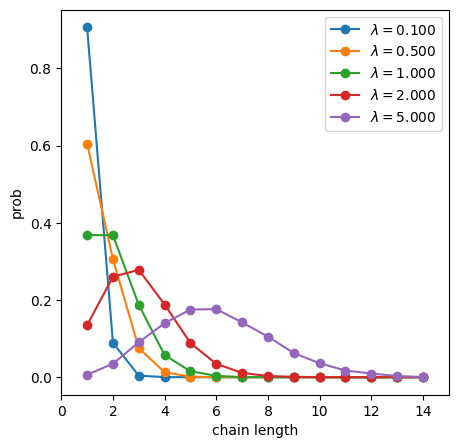

In [71]:
plt.ion()
plt.rcParams["figure.figsize"] = (5,5)
plt.rcParams["figure.dpi"]=100

lam_list = [0.1, 0.5, 1, 2, 5]
for lam in lam_list:
    s = np.random.poisson(lam, 10000)
    yarr, xarr = np.histogram(s, bins = [i-0.5 for i in range(15)], density=True)
    plt.plot(xarr[:-1] + 1.5, yarr, 'o-', label = r'$\lambda = ${:.3f}'.format(lam))
plt.legend()
plt.xlabel('chain length')
plt.xlim([0,15])
plt.ylabel('prob')
plt.show()

In [109]:
Number_of_chains = 100
lam = 0.5
all_chain_coups = []
all_chain_nodes = []
all_chain_lens = []
length_of_chains = np.random.poisson(lam, Number_of_chains) + 1
added_chains = 0
print(length_of_chains)
for i in range(Number_of_chains):
    check = 0
    while check == 0:
        #choose a chainlength
        #N=np.random.choice(cycle_lengths)
        N = length_of_chains[i]
        if N == 1:
            check = 1
        else:
            #make the chain
            chain_coups, chain_nodes, int_error = create_N_chain(N)
            if any(node in all_chain_nodes for node in chain_nodes):
                check = 0
            else:
                all_chain_coups.extend(chain_coups)
                all_chain_nodes.extend(chain_nodes)
                all_chain_lens.append(N)
                check = 1
                added_chains += 1

all_chain_coups_new = []
for coup in all_chain_coups:
    tup_out, good_tup = check_coupler(coup)
    if good_tup ==1:
        all_chain_coups_new.append(tup_out)
    else:
        print("bad coupler")
all_chain_coups = all_chain_coups_new
print(all_chain_coups)

[1 2 2 1 1 1 1 1 1 1 4 1 1 2 1 1 2 1 2 2 2 2 2 1 1 3 1 1 1 1 1 1 1 2 1 2 2
 1 3 2 2 1 2 1 4 1 3 2 2 1 1 3 1 1 1 1 2 1 4 1 2 1 1 1 3 2 2 1 1 1 2 2 2 1
 1 2 2 3 1 1 2 1 2 1 1 2 1 2 2 2 1 1 1 2 1 5 2 3 2 1]
[(60, 356), (79, 537), (286, 479), (455, 286), (274, 455), (479, 274), (163, 526), (63, 552), (408, 412), (195, 499), (14, 472), (66, 428), (87, 529), (536, 35), (35, 540), (540, 536), (338, 341), (523, 527), (277, 431), (381, 124), (377, 381), (124, 377), (182, 494), (276, 383), (189, 418), (264, 351), (264, 335), (335, 284), (284, 351), (160, 290), (294, 160), (290, 294), (105, 353), (307, 310), (201, 355), (355, 358), (358, 201), (225, 359), (0, 320), (344, 0), (24, 344), (320, 24), (102, 461), (318, 168), (168, 314), (314, 318), (200, 299), (248, 327), (148, 333), (211, 491), (129, 133), (44, 340), (7, 544), (88, 348), (348, 345), (345, 88), (224, 291), (259, 543), (121, 389), (68, 361), (6, 496), (220, 342), (40, 41), (444, 445), (90, 444), (433, 90), (445, 125), (125, 433), (197,

In [128]:
#random graph
# h = {v: np.random.uniform(-1,1) for v in nodes_avail}
# print("Bias random assigned to", len(h), "qubits.")
h = {v: 0 for v in nodes_avail}
print("Bias 0 assigned to", len(h), "qubits.")
choices_J = [-1, 0.9]
J = {tuple(c): np.random.choice(choices_J) for c in couplers_avail}
print("Strengths {} assigned randomly to".format(choices_J),len(J),"couplers.")

#fill with chains
J_coups = list(J.keys())
for i in range(len(all_chain_coups)):
    chain_coup = all_chain_coups[i]
    if chain_coup in J_coups:
        J[chain_coup] = -2.0
    elif Reverse(chain_coup) in J_coups:
        J[Reverse(chain_coup)] = -2.0
    else:
        print("bad coup")

J_color = []
for coup in J.keys():
    if J[coup] == -2.0:
        J_color.append('blue')
    else:
        J_color.append('bisque')
print('chains added: ', added_chains)

Bias 0 assigned to 563 qubits.
Strengths [-1, 0.9] assigned randomly to 4790 couplers.
chains added:  46


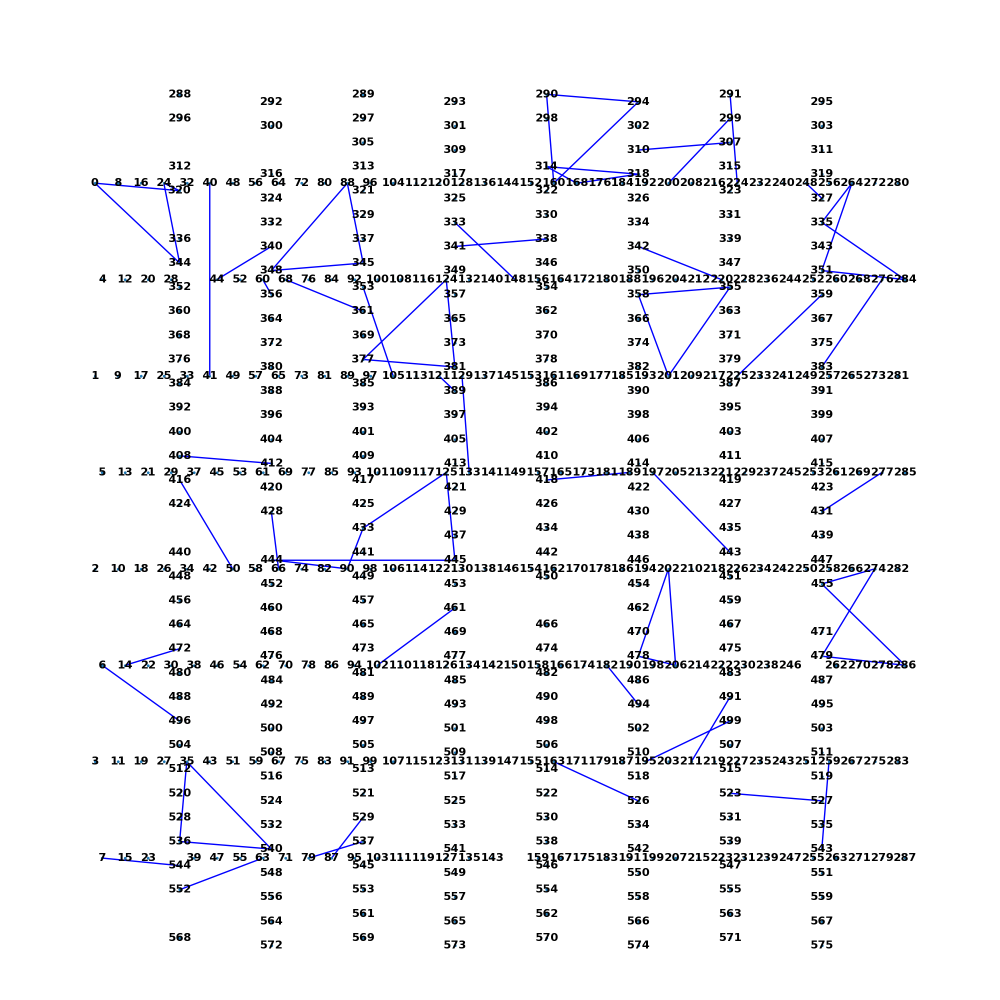

In [116]:
final_coups_list = list(J.keys())
all_nodes_list = list(h.keys())

plt.ion()
plt.rcParams["figure.figsize"] = (10,10)
plt.rcParams["figure.dpi"]=200
G = dnx.zephyr_graph(4)
labels = {}
for qubit in sampler.nodelist:
    if qubit in all_nodes_list:
        labels.update({qubit:qubit})
    else:
        labels.update({qubit:""})
dnx.draw_zephyr(G, node_size = 1, edgelist = all_chain_coups, 
nodelist = sampler.nodelist, font_size = 8, edge_color = 'blue', 
labels = labels, font_weight = "bold")
plt.show()

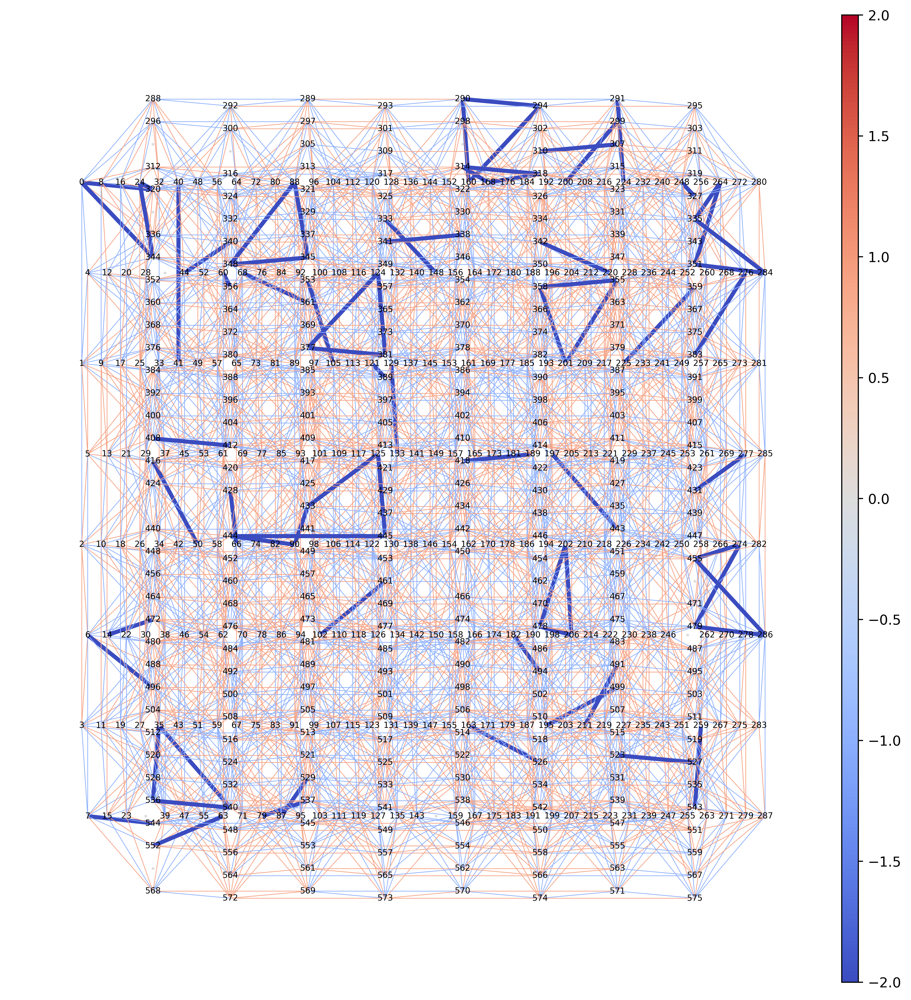

In [137]:

# width_list = [0.5] * len(sampler.edgelist)

plt.ion()
plt.rcParams["figure.figsize"] = (10,10)
plt.rcParams["figure.dpi"]=500
G = dnx.zephyr_graph(4)
width_list = []
for coup in G.edges():
    if coup in J:
        if J[coup] == -2.0:
            width_list.append(3.0)
        else:
            width_list.append(0.5)
    else:
        width_list.append(0.0)
dnx.draw_zephyr(G, linear_biases = h, quadratic_biases = J, node_size = 1, labels = labels, font_size = 6, width = width_list)
plt.show()

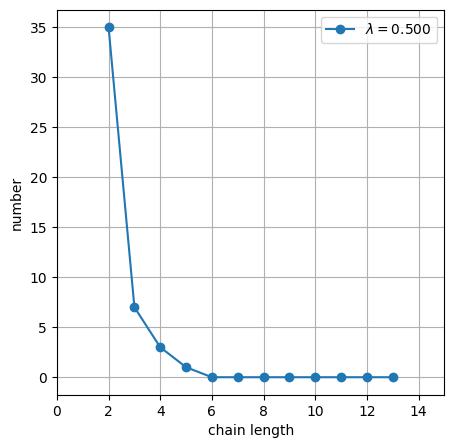

In [144]:
plt.ion()
plt.rcParams["figure.figsize"] = (5,5)
plt.rcParams["figure.dpi"]=100

yarr, xarr = np.histogram(length_of_chains, bins = [i-0.5 for i in range(15)])
plt.plot(xarr[2:-1] + 0.5, yarr[2:], 'o-', label = r'$\lambda = ${:.3f}'.format(lam))
plt.legend()
plt.xlabel('chain length')
plt.xlim([0,15])
plt.ylabel('number')
plt.grid()
plt.show()

In [105]:
length_of_chains

array([2, 1, 4, 1, 1, 2, 1, 2, 1, 1, 1, 3, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1])